<a href="https://colab.research.google.com/github/3RFUNn/Computational-Game-Design/blob/main/VisualisationLab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Erfan Rafieioskouei - 240842587

## ECS7017P Lab 1
# Visualising Player Deaths in *PUBG: Battlegrounds*

In this week’s lab you will use this [Jupyter Notebook](https://docs.jupyter.org/en/latest/) to create Python visualisations of a player death dataset from the Battle Royale game *PUBG: Battlegrounds*. A notebook is a series of editable cells, containing either Python code (Code cells) or formatted text (Markdown cells). This notebook was written for [Google Colab](https://colab.research.google.com/) - but it could be run on another cloud service (like [Binder](https://mybinder.org/)) or [locally](https://jupyter.org/install).

### Exercises

The exercises in this lab are assessed, as part of the first coursework in this module. There are 25 marks available.
* Exercise 1 involves making a simple scatter plot of player death locations. (3 points)
* Exercise 2 requires you to create a heatmap of the same data. (3 points)
* Exercise 3 breaks down the dataset by weapon type, and asks you to compare these deaths using
heatmaps. (5 points)
* Exercise 4 looks at how kill distance varies across the map. (6 points)
* Exercise 5 involves creating a balance heatmap comparing deaths versus kills. (8 points)

### Submitting Your Work

Save/download a copy of the notebook and include that **ipynb file** in your ZIP file submission for Coursework 1. That file should include all your lab work, i.e. any code/text you've added, and images you generated.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cmap

%matplotlib inline
plt.rcParams["figure.figsize"] = (10,10)
! mkdir maps

# Accessing Kaggle

The [PUBG Match Deaths and Statistics dataset](https://www.kaggle.com/skihikingkevin/pubg-match-deaths) is available
on [Kaggle](https://www.kaggle.com/).

Accessing Kaggle on Google Colab (other Jupyter platforms may not require this): register for a free Kaggle account and generate an API token. On the Kaggle website, under Account / API, select ”Create New API Token” and download the resulting token file kaggle.json. View the notebook files (folder on the left sidebar) and upload the token file.

You can now configure the notebook to access your Kaggle account:

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

# Download the Dataset

Download and unzip the PUBG dataset:

In [ ]:
! kaggle datasets download skihikingkevin/pubg-match-deaths
! unzip pubg-match-deaths.zip

Dataset URL: https://www.kaggle.com/datasets/skihikingkevin/pubg-match-deaths
License(s): CC0-1.0
100% 4.10G/4.10G [00:55<00:00, 77.3MB/s]
100% 4.10G/4.10G [00:55<00:00, 79.2MB/s]
Archive:  pubg-match-deaths.zip
  inflating: aggregate/agg_match_stats_0.csv  
  inflating: aggregate/agg_match_stats_1.csv  
  inflating: aggregate/agg_match_stats_2.csv  
  inflating: aggregate/agg_match_stats_3.csv  
  inflating: aggregate/agg_match_stats_4.csv  
  inflating: deaths/kill_match_stats_final_0.csv  
  inflating: deaths/kill_match_stats_final_1.csv  
  inflating: deaths/kill_match_stats_final_2.csv  
  inflating: deaths/kill_match_stats_final_3.csv  
  inflating: deaths/kill_match_stats_final_4.csv  
  inflating: erangel.jpg             
  inflating: miramar.jpg             


This should take about 5 minutes. Use the time to read up on the [pandas library](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html). And if you don’t know *PUBG: Battlegrounds* then you should familiarise yourself with the basic gameplay ([Wikipedia](https://en.wikipedia.org/wiki/PUBG:_Battlegrounds#Gameplay), [YouTube](https://www.youtube.com/watch?v=lsXMumRLo6I)).


# The PUBG Dataset

Import the Erangel map that comes with the dataset:

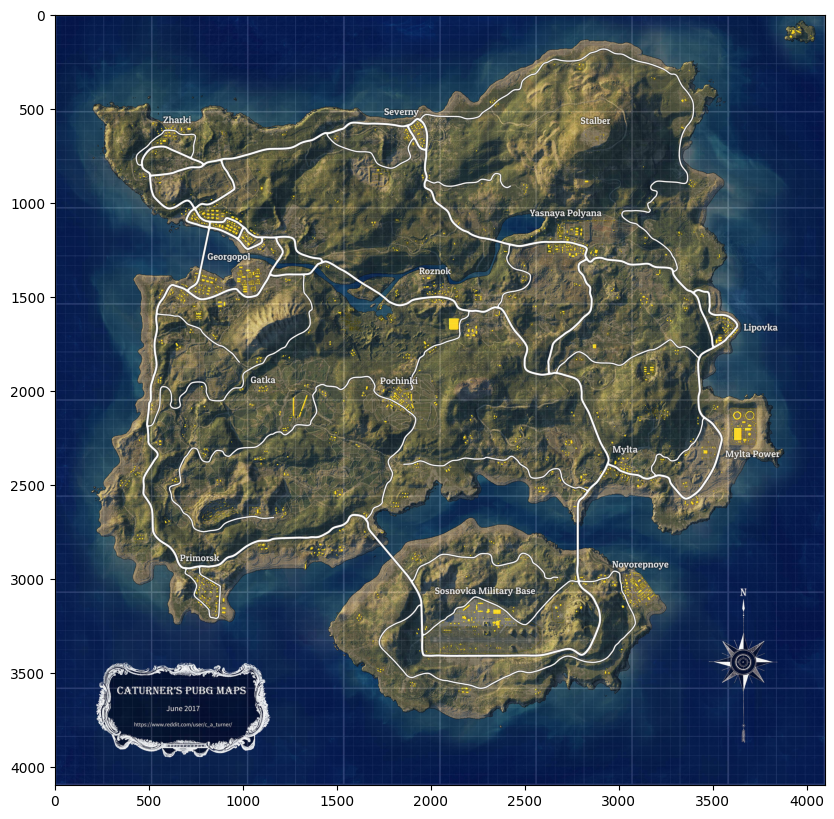

In [ ]:
map_img = plt.imread('erangel.jpg')
plt.imshow(map_img)

The player death data is in five CSV files, each with log data on 13 million deaths. For this lab, we will just
use one file:


In [ ]:
deaths = pd.read_csv("deaths/kill_match_stats_final_0.csv")

This imports the CSV data into a pandas dataframe. Check this [short introduction](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html) if you are not familiar
with the pandas library. Use head to view the first few rows of the dataframe. Use len(deaths.index) to view
the total number of rows. Each row records a death, with records coordinates of the victim and of their killer.
Valid x and y coordinates should be between 0 to 800,000.

In [ ]:
print(deaths.head())

        killed_by  killer_name  killer_placement  killer_position_x  \
179  Down and Out    Malcolm_x               9.0           496989.8   
180         M16A4    Malcolm_x               9.0           496989.8   
181           AKM       G_Berg               7.0           460416.7   
182           AKM  Lukesnake17              20.0           488034.1   
183           SKS     AlooGobi               2.0           501062.9   

     killer_position_y      map  \
179           312569.7  ERANGEL   
180           312569.7  ERANGEL   
181           414748.8  ERANGEL   
182           347220.3  ERANGEL   
183           425078.6  ERANGEL   

                                              match_id  time  victim_name  \
179  2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...  1035      Relugar   
180  2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...  1035  LiPoBattery   
181  2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...  1422     cornsour   
182  2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...

# Data Preparation

For this lab, we are only interested in a subset of the data:
* deaths on the Erangel map;
* deaths with complete data;
* deaths within the map boundaries.

Let's filter out the unwanted data.

In [ ]:
# Only the Erangel map
deaths = deaths[deaths["map"] == "ERANGEL"]
# Only rows with missing data
deaths = deaths.dropna()
# Only within map boundaries
max_xy = 800000
deaths = deaths[deaths['victim_position_x'] < max_xy]
deaths = deaths[deaths['victim_position_y'] < max_xy]

Now check how many rows are left in the deaths dataframe.

In [ ]:
len(deaths)

9928791

Now remove rows where the killer’s position was outside the map boundary. How many rows remain?

In [ ]:
# Add your code to filter by killer position
deaths = deaths[deaths['killer_position_x'] < max_xy]
deaths = deaths[deaths['killer_position_y'] < max_xy]
len(deaths)

9928791

This is still far more data than we need to create our visualisations, so we take a sample of N deaths to work with. Set N to a value between 100k and 800k. You can adjust your sample size later on if needed, to help with the visualisation.

In [ ]:
N = 500000
sample = deaths.head(N)

# Player Deaths Scatterplot

Now visualise the player deaths as a scatterplot on top of the map.

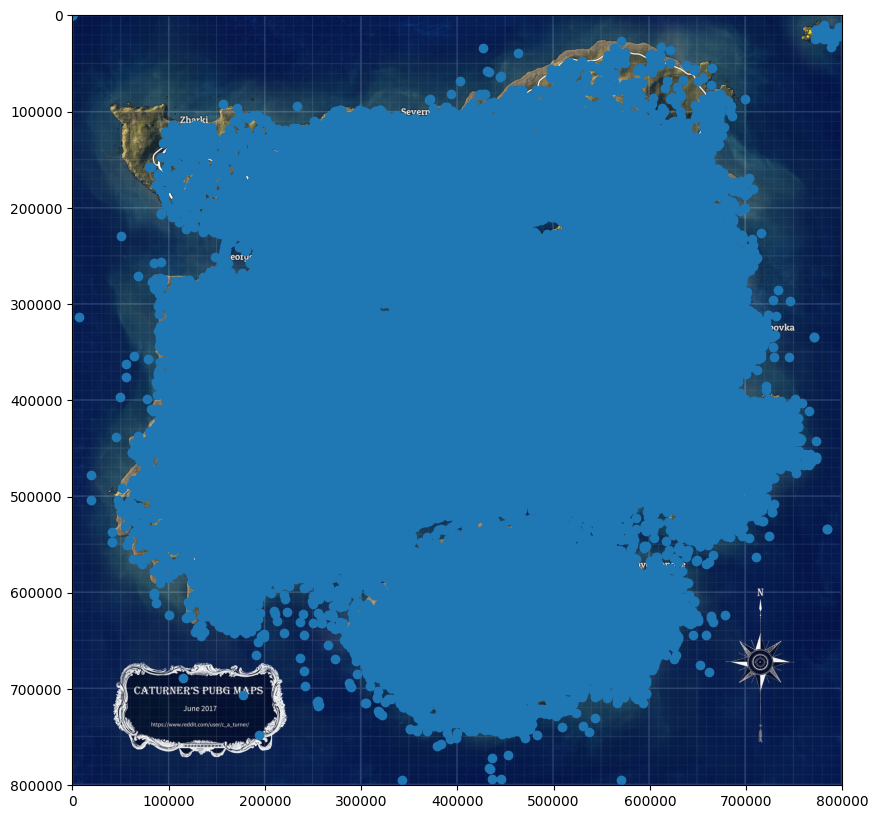

In [ ]:
fig, ax = plt.subplots()
ax.set_ylim(800000,0)
ax.set_xlim(0,800000)
ax.imshow(map_img,extent=[0,max_xy,max_xy,0])
ax.scatter(sample["victim_position_x"], sample["victim_position_y"])

# Exercise 1: Player Death Scatterplot

You can adjust your plot using the following parameters on scatter:
* s: point area.
* alpha: transparency, between 0.0 and 1.0.
* color: plot color, e.g. ”red”.
  
Adjust the plot above to create a good visualisation of player death locations. Both the map and the data should be visible. Explain your choices.

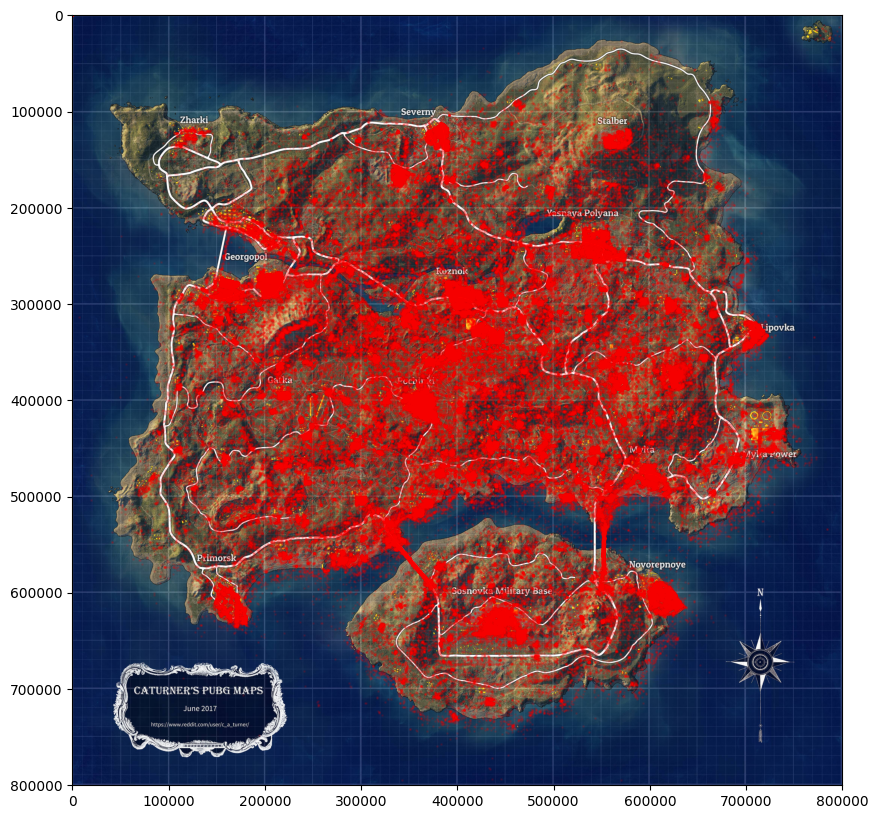

In [ ]:
fig, ax = plt.subplots()
ax.set_ylim(800000,0)
ax.set_xlim(0,800000)
ax.imshow(map_img,extent=[0,max_xy,max_xy,0])
ax.scatter(sample["victim_position_x"], sample["victim_position_y"], s=1, alpha=0.1, color='red')

##Explanation of Choices:

s=1 (point area): Reduced the point size to 1 to avoid overcrowding and make individual points smaller. <br>
<br>
alpha=0.1 (transparency): Set the transparency to 0.1, making the points semi-transparent. This helps to see the map clearer. <br>
<br>
color='red' (plot color): Chose red as the color for the points as it provides good contrast against the map background, making the death locations stand out clearly. <br>
<br>
By using these parameter adjustments, the scatter plot now effectively visualizes the player death locations while maintaining the visibility of the underlying map.

# Player Deaths Heatmap

### Heatmap code

In [ ]:
killer_loc = ['killer_position_x','killer_position_y']
victim_loc = ['victim_position_x','victim_position_y']
pd.set_option('mode.chained_assignment', None)

# The hm cells function counts the number of deaths in each heatmap cell
def hm_cells(df, n, cols=victim_loc):
    cell_size = max_xy / n
    cells = np.zeros(shape=(n,n), dtype=int)
    for index, row in df.iterrows():
        x = int(row[cols[0]] // cell_size)
        y = int(row[cols[1]] // cell_size)
        cells[y,x] = cells[y,x] + 1
    return cells

# The heatmap function plots this cell data on top of the map
def heatmap(cells, n, log=False, showMap=True, alpha=0.5):
    if (log):
        np.seterr(divide = 'ignore')
        cells = np.log2(cells)
        cells[np.isneginf(cells)] = 0

    hm_fig, hm_ax = plt.subplots()
    hm_ax.set_ylim(n, 0)
    hm_ax.set_xlim(0, n)
    if (showMap):
        hm_ax.imshow(map_img, extent=[0,n,n,0])
    hm_ax.imshow(cells, alpha=alpha, cmap=cmap.hot)
    return hm_fig

### Create a heatmap

Next we make a heatmap with MxM cells, for some sensible M. The aim of any visualisation is to clearly communicate something about a
dataset to the viewer. In this case, we want to show where players have died. We will need to choose appropriate parameters to make this
clear.

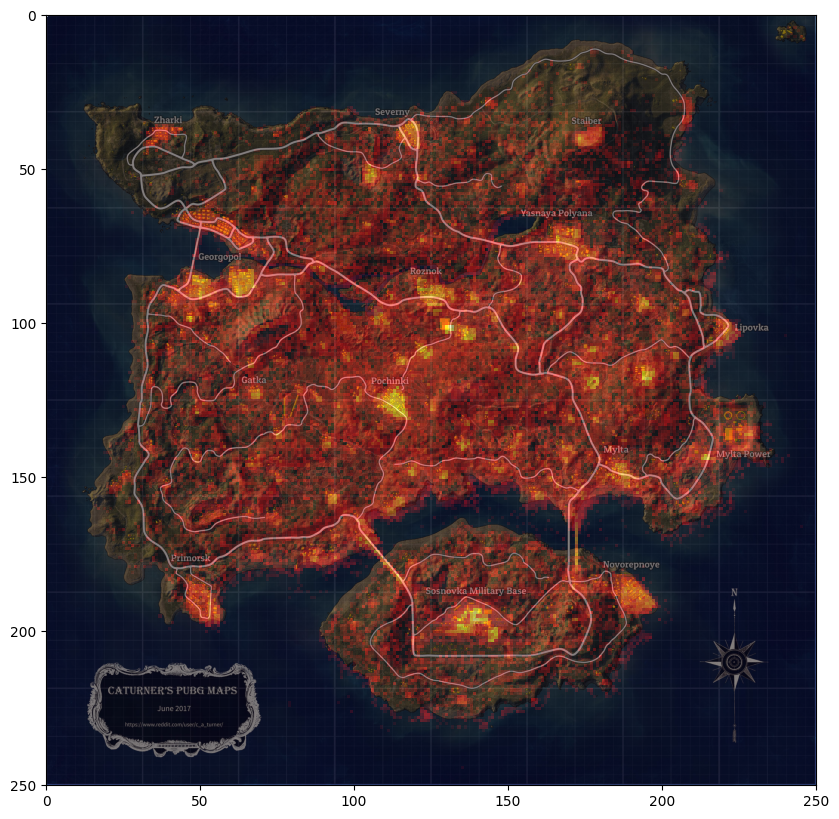

In [ ]:
# Experiment with parameters
M = 250  # Increased cell number for higher resolution
fig = heatmap(hm_cells(sample, M), M, log=True, alpha=0.5)

# Exercise 2: Deaths Heatmap

Experiment with the cell, log and alpha parameters above until you have a good heatmap visualisation of player deaths. Explain in words why you chose these specific parameters.

##Explanation of Choices:

M = 250 (Cell Number): Increasing the cell number to 250 creates a higher resolution heatmap which gives better visualization.
<br> <br>
log=True (Logarithmic Scale): Using a logarithmic scale helps to visualize data with a wide range of values more effectively, making it easier to see both high-density and low-density areas on the heatmap.
<br> <br>
alpha=0.5 (Transparency): Setting the transparency to 0.5 creates a balance between the heatmap and the underlying map image. This allows us to see the heatmap data clearly while still being able to discern the map features underneath.
<br><br>
By using these parameter adjustments, the heatmap effectively visualizes player death locations while we still have the visibility of the map.

# Visualising Weapon Types

Next you will look at how diﬀerent kinds of weapon (or other causes of death) vary across the map. Let’s group
the weapons into a few distinct types to help with this analysis.

In [ ]:
rifles = ['AKM', 'M416', 'SCAR-L', 'M16A4', 'Groza', 'AUG', 'SKS', 'Mini 14', 'VSS', 'Mk14']
shotguns = ['S1897', 'S12K', 'S686']
explosives = ['Grenade', 'death.ProjMolotov_DamageField_C', 'death.ProjMolotov_C']
pistols = ['P92', 'P1911', 'R1895' 'P18C']
snipers = ['Kar98k', 'M24', 'AWM', 'Crossbow']
melee = ['Pan', 'Sickle', 'Crowbar', 'Machete', 'Punch', 'Pan']
submg = ['Micro UZI', 'Tommy Gun', 'UMP9', 'Vector', 'VSS']
mg = ['M249', 'DP-28']
vehicles = ['Uaz', 'Motorbike (SideCar)', 'Hit by Car', 'Buggy', 'Dacia', 'Motorbike',
'Boat', 'Aquarail']

# Exercise 3: Deaths by Weapon Heatmaps

Write a function `label_weapon(row)` which takes a dataframe rowas input and returns a string
label based on `row['killed by']`. Use this to add a new column to your sample data:

`sample['WeaponType'] = sample.apply(label_weapon, axis=1)`

Create heatmaps to compare some of these weapon types. Explain in words what diﬀerences you observe between death by these weapons
and why you think they might be diﬀerent.

In [ ]:
def label_weapon(row):
    """
    Classifies the weapon type based on the 'killed_by' column in a dataframe row.

    Args:
        row: A row from the dataframe.

    Returns:
        A string label representing the weapon type.
    """
    if row['killed_by'] in rifles:
        return 'Rifle'
    elif row['killed_by'] in shotguns:
        return 'Shotgun'
    elif row['killed_by'] in explosives:
        return 'Explosive'
    elif row['killed_by'] in pistols:
        return 'Pistol'
    elif row['killed_by'] in snipers:
        return 'Sniper'
    elif row['killed_by'] in melee:
        return 'Melee'
    elif row['killed_by'] in submg:
        return 'Submachine Gun'
    elif row['killed_by'] in mg:
        return 'Machine Gun'
    elif row['killed_by'] in vehicles:
        return 'Vehicle'
    else:
        return 'Other'

# Apply the function to create the 'WeaponType' column
sample['WeaponType'] = sample.apply(label_weapon, axis=1)

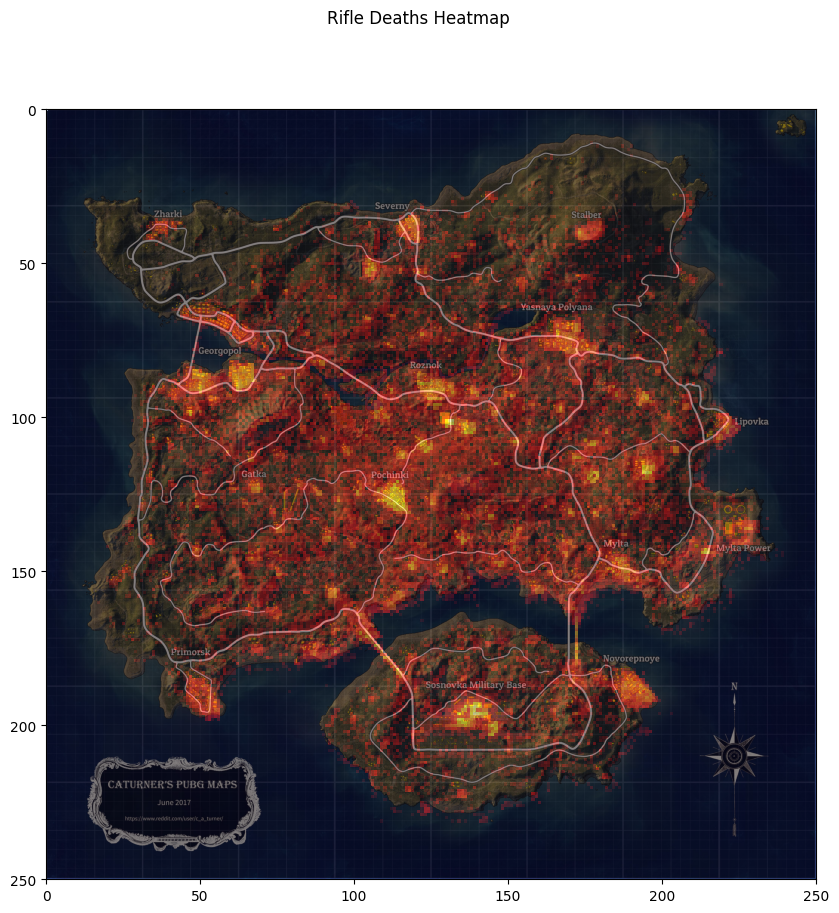

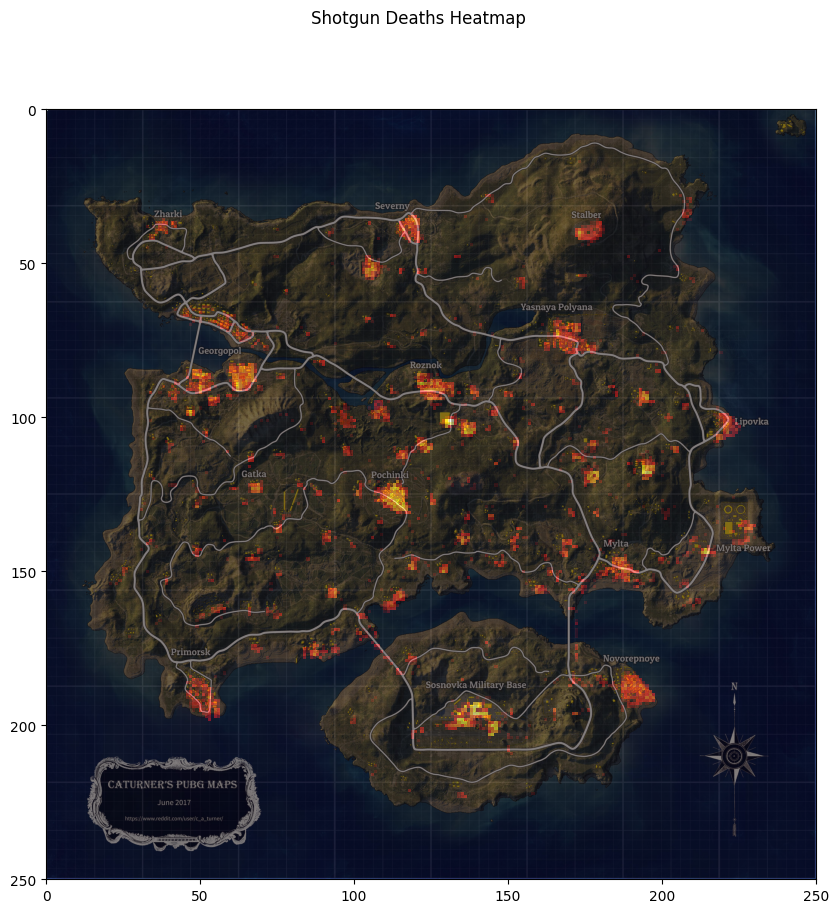

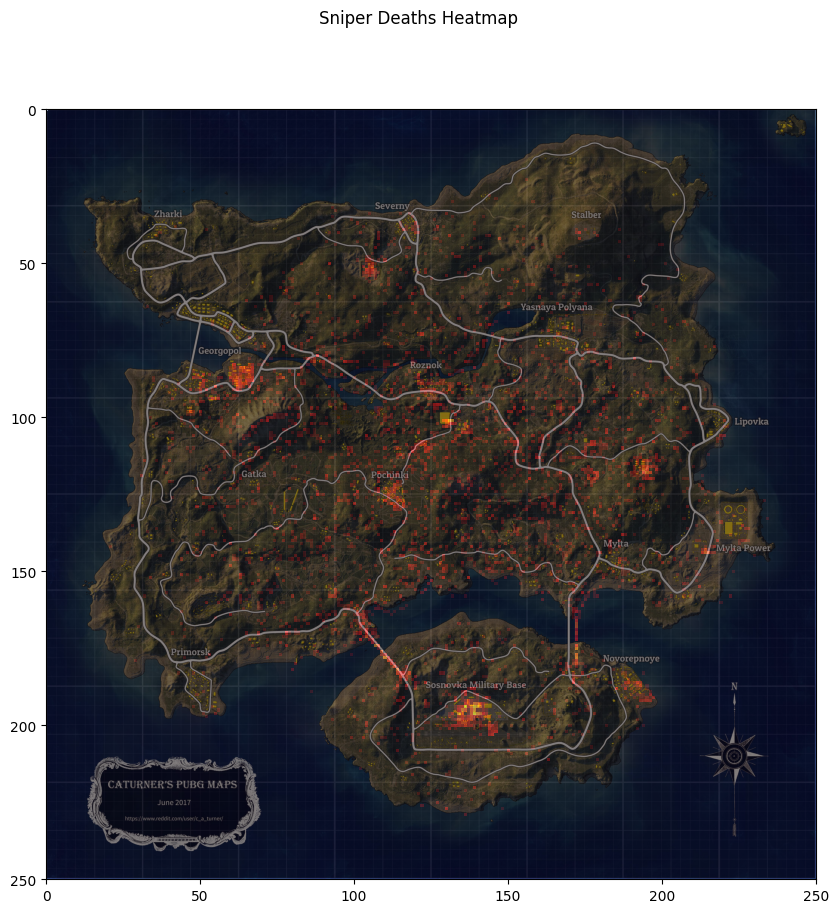

In [ ]:
# Filter data for specific weapon types
rifles_deaths = sample[sample['WeaponType'] == 'Rifle']
shotguns_deaths = sample[sample['WeaponType'] == 'Shotgun']
snipers_deaths = sample[sample['WeaponType'] == 'Sniper']

# Generate heatmaps
rifle_heatmap = heatmap(hm_cells(rifles_deaths, M), M, log=True, alpha=0.5)
rifle_heatmap.suptitle('Rifle Deaths Heatmap')

shotgun_heatmap = heatmap(hm_cells(shotguns_deaths, M), M, log=True, alpha=0.5)
shotgun_heatmap.suptitle('Shotgun Deaths Heatmap')

sniper_heatmap = heatmap(hm_cells(snipers_deaths, M), M, log=True, alpha=0.5)
sniper_heatmap.suptitle('Sniper Deaths Heatmap')

plt.show()

###Observation :
what we can see is that the rifle heatmaps are the ones with more density and ocuring rates. They are more common and hapened in nearly every part of the map but ususally in places with higher resources. <br> <br>
The shotgun kills are the ones in second place and as you can see they way less than the rifle ones but although they are less they have a dense heatmap in places of happening as if you can see in places like towns and stuff the shotgun kills have large heatmaps.<br><br>
As for the snniper kills they are the ones with the least rate but the funny thing is because of their high range they are limited into populated areas and the kills are spread all over the map. it's like the rifle heat map but with less density.

# Exercise 4: Visualising Kill Distance

Add a new column distance to your sample data, defined by the straight line distance between the victim’s and the killer’s locations. You can use np.sqrt and np.square.

Write a modified version of `hm_cells` which sums the total distance values for each cell. Divide these by the death count for each cell to get the average death distance for each cell. Visualise this as a heatmap. Explain in words what patterns you observe, if any.

In [ ]:
sample['distance'] = np.sqrt(np.square(sample['killer_position_x'] - sample['victim_position_x']) +
                             np.square(sample['killer_position_y'] - sample['victim_position_y']))

In [ ]:
def hm_cells_distance(df, n, cols=victim_loc):
    cell_size = max_xy / n
    cells = np.zeros(shape=(n, n), dtype=float)  # Changed dtype to float
    counts = np.zeros(shape=(n, n), dtype=int)  # Added to store death counts

    for index, row in df.iterrows():
        x = int(row[cols[0]] // cell_size)
        y = int(row[cols[1]] // cell_size)
        cells[y, x] += row['distance']  # Add distance to the cell
        counts[y, x] += 1  # Increment death count for the cell

    # Calculate average distance, handle zero division
    with np.errstate(divide='ignore', invalid='ignore'):
        cells = np.where(counts > 0, cells / counts, 0)

    return cells

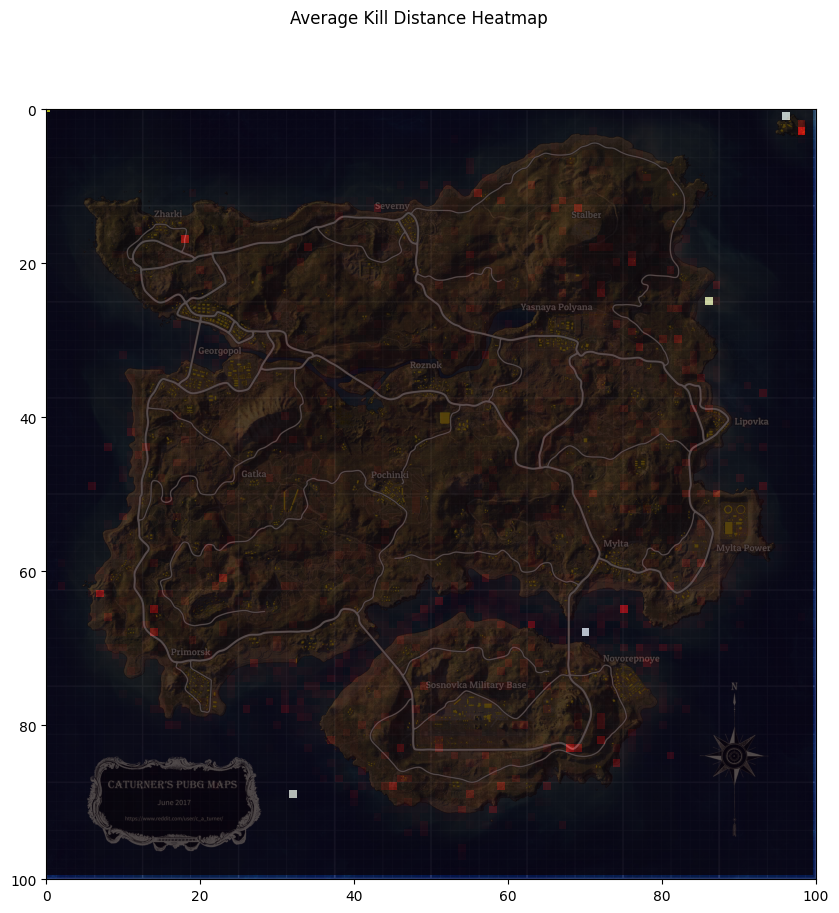

In [ ]:
distance_heatmap = heatmap(hm_cells_distance(sample, M), M, log=False, alpha=0.7)  # log=False for average distance
distance_heatmap.suptitle('Average Kill Distance Heatmap')
plt.show()

After running this code, observe the heatmap. I observed this pattern: <br>

Hotter colors (red/yellow): indicate areas where kills tend to happen from a longer distance. These might be open areas or areas with good vantage points for snipers. <br><br>
No colors : The places that dont have hot colors are the ones which the average kill distance was low and it may have been shotguns or vehicle kills.

# Exercise 5: Balance Heatmaps

Create a heatmap which visualises the diﬀerence between killers and victims across the island, in a similar fashion to the balance maps developed for War on Cybertron (see lecture on Visualisation). Explain in words what patterns you observe, if any.

In [ ]:
# Calculate heatmap for victim locations
victim_cells = hm_cells(sample, M, cols=victim_loc)

# Calculate heatmap for killer locations
killer_cells = hm_cells(sample, M, cols=killer_loc)

In [ ]:
# Calculate the difference between killer and victim heatmaps
balance_cells = killer_cells - victim_cells

<ipython-input-18-c9cc50587215>:19: RuntimeWarning: invalid value encountered in log2
  cells = np.log2(cells)


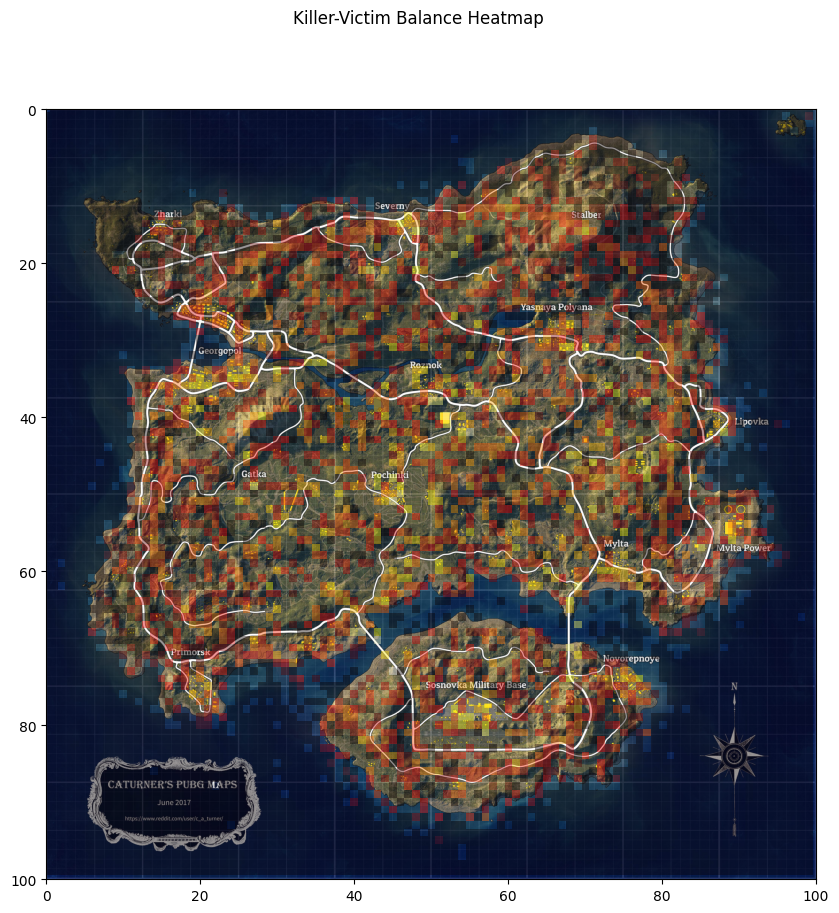

In [ ]:
# Create the balance heatmap
balance_heatmap = heatmap(balance_cells, M, log=True, alpha=0.4)
balance_heatmap.suptitle('Killer-Victim Balance Heatmap')

plt.show()

After running the code, observe the heatmap, I observed the following: <br>

Red/Yellow Areas (Positive Balance): Indicate areas where there are more killers than victims. These could be popular drop zones or areas where players tend to engage in combat more frequently.<br><br>
Blue Areas (Negative Balance): Show areas with more victims than killers. These might be areas where players are more likely to get ambushed or caught off guard.<br><br>
Neutral Areas (Near Zero Balance): Represent areas where the number of killers and victims is roughly equal. These might be less frequented areas or areas where players tend to move through quickly.


# Submission Reminder

Your single ZIP file submission should include a modified copy of this notebook (a .ipynb file) documenting your lab work.